In [14]:
import numpy as np
import matplotlib.pyplot as plt
from allensdk.brain_observatory.ecephys.ecephys_project_cache import EcephysProjectCache
import sys
import os
import pandas as pd

PROJECT_PATH = "G:/Shared drives/visual_encoding"
# REPO_PATH = "C:/Users/User/visual_encoding"
MANIFEST_PATH = "E:/datasets/allen_vc/manifest_files"

sys.path.append("../..")
from allen_vc.epoch_extraction_tools import *
from allen_vc.plts import plot_epochs

print("Packages Imported")

Packages Imported


In [7]:
SESSIONS = ['766640955',
            '767871931',
            '768515987',
            '771160300',
            '771990200',
            '774875821',
            '778240327',
            '778998620',
            '779839471',
            '781842082',
            '786091066',
            '787025148',
            '789848216',
            '793224716',
            '794812542',
            '816200189',
            '821695405',
            '829720705',
            '831882777',
            '835479236',
            '839068429',
            '840012044',
            '847657808']

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
def plot_epochs(signal, time, epochs, epochs_2=None, threshold=None, 
                mark_epochs=True, shade_epochs=True):
    """Plots a signal over time, with annotations for epochs.

    Parameters
    ----------
    signal : numpy array
        Signal to be plotted.
    time : numpy array
        Time stamps for the signal.
    epochs : 2D numpy array
        Epochs to annotate.
    epochs_2 : 2D numpy array, optional
        Second set of epochs to annotate.
    threshold : float, optional
        Horizontal line at given value.
    mark_epochs : bool, optional
        If True, vertical lines are drawn at the start and end of each epoch.
    shade_epochs : bool, optional
        If True, epochs are shaded in green.

    Returns
    -------
    fig, ax : matplotlib Figure, Axes
        Figure and axes for the plot.
    """

    # plot signal
    fig, ax = plt.subplots(figsize=[20,4])
    ax.plot(time, signal, color='k')

    # label plot
    ax.set_xlabel('Time (s)')

    # annotate threshold
    if threshold is not None:
        ax.axhline(threshold, color='k', linestyle='--', linewidth=1)

    # annotate epochs
    if len(epochs) != 0:
        if mark_epochs:
            for t_start in np.array(epochs[:,0]):
                ax.axvline(t_start, color='grey')
            for t_stop in np.array(epochs[:,1]):
                ax.axvline(t_stop, color='k')
        if shade_epochs:
            for t_start, t_stop in epochs:
                ax.axvspan(t_start, t_stop, color='g', alpha=0.2)

    # annotate epochs_2
    if epochs_2 is not None and len(epochs_2) != 0:
        if mark_epochs:
            for t_start in np.array(epochs_2[:,0]):
                ax.axvline(t_start, color='grey', linestyle='--')
            for t_stop in np.array(epochs_2[:,1]):
                ax.axvline(t_stop, color='k', linestyle='--')
        if shade_epochs:
            for t_start, t_stop in epochs_2:
                ax.axvspan(t_start, t_stop, color='b', alpha=0.2)

    return fig, ax

In [5]:
# # Create Allensdk cache object
# cache = EcephysProjectCache.from_warehouse(manifest=f"{MANIFEST_PATH}/manifest.json")

# # load session data
# sessions_all = cache.get_session_table()
# session_ids = sessions_all[sessions_all['session_type']=='functional_connectivity'].index.values

# Running Data

In [6]:
# settings for testing
THRESHOLD = 1
MIN_GAP = 3
MIN_DURATION = 30
RF = 50

Look at epoch distribution for each step of the process.

Find Segments:


Analyzing session: 	766640955
Identified 44 epochs

Above Epochs: 44	Below Epochs: 45


Analyzing session: 	767871931
Identified 22 epochs

Above Epochs: 22	Below Epochs: 22


Analyzing session: 	768515987
Identified 157 epochs

Above Epochs: 157	Below Epochs: 157


Analyzing session: 	771160300
Identified 75 epochs

Above Epochs: 75	Below Epochs: 76


Analyzing session: 	771990200
Identified 47 epochs

Above Epochs: 47	Below Epochs: 48


Analyzing session: 	774875821
Identified 50 epochs

Above Epochs: 50	Below Epochs: 51


Analyzing session: 	778240327
Identified 114 epochs

Above Epochs: 114	Below Epochs: 113


Analyzing session: 	778998620
Identified 14 epochs

Above Epochs: 14	Below Epochs: 14


Analyzing session: 	779839471
Identified 56 epochs

Above Epochs: 56	Below Epochs: 57


Analyzing session: 	781842082
Identified 48 epochs

Above Epochs: 48	Below Epochs: 49


Analyzing session: 	786091066
Identified 2 epochs

Above Epochs: 2	Below Epochs: 1


Analyzing session: 	78702514

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Analyzing session: 	847657808
Identified 60 epochs

Above Epochs: 60	Below Epochs: 61



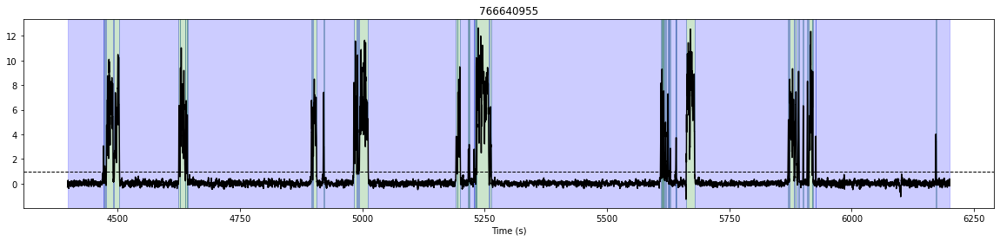

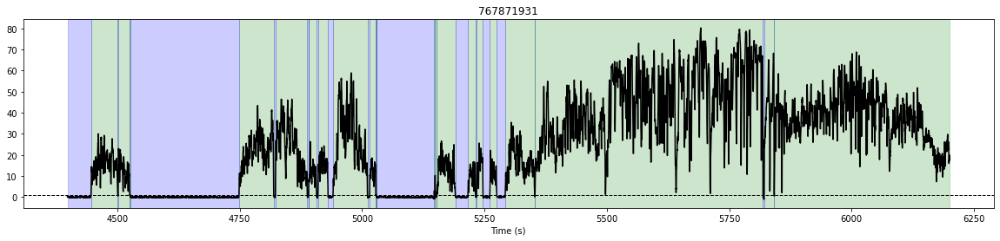

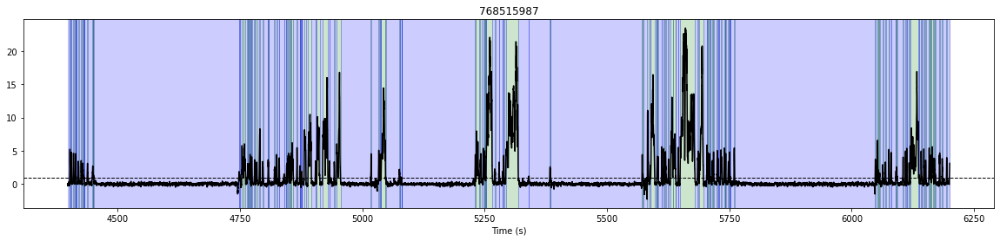

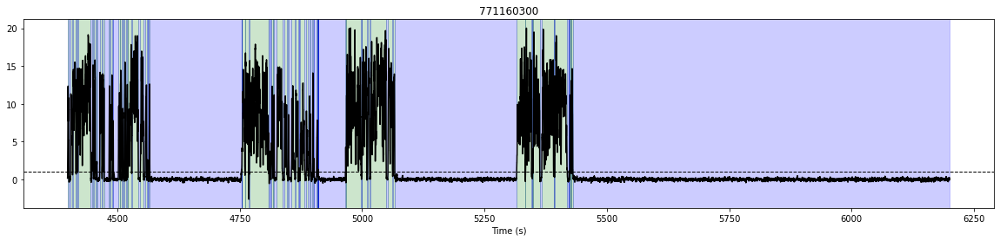

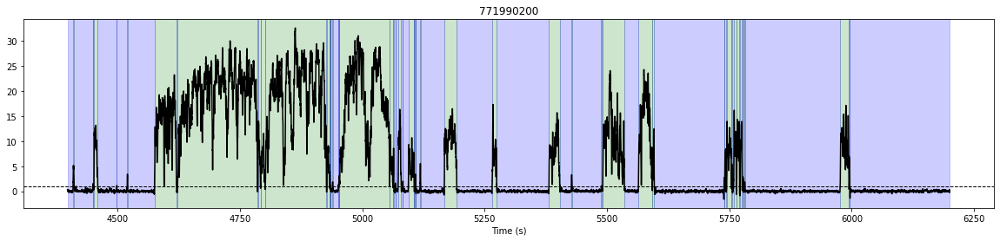

...

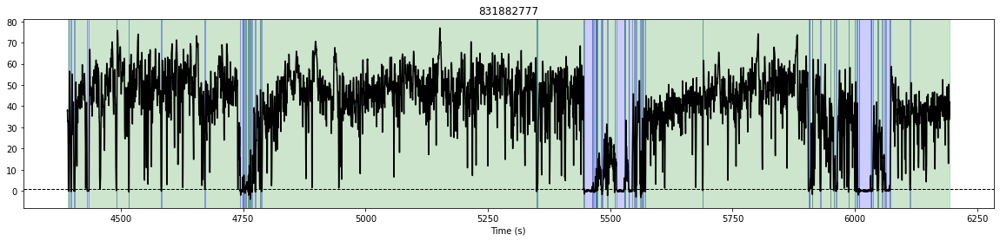

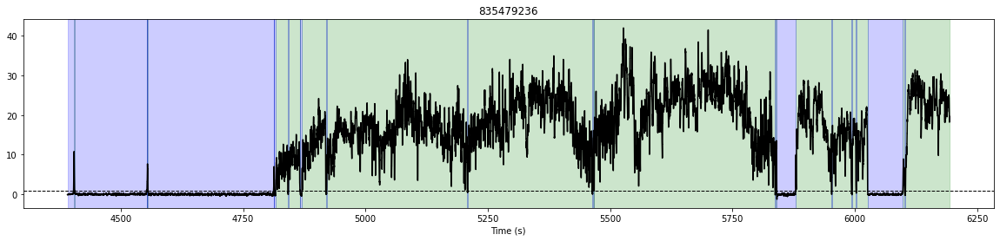

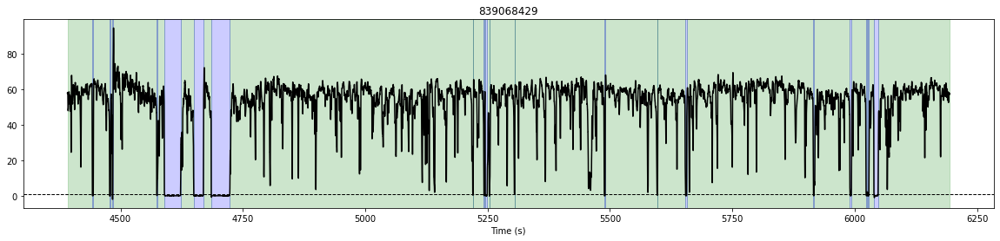

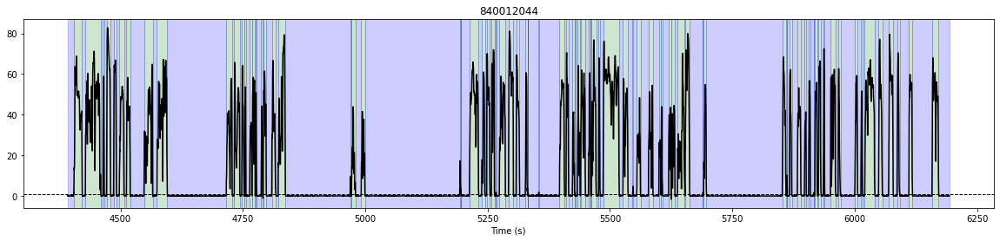

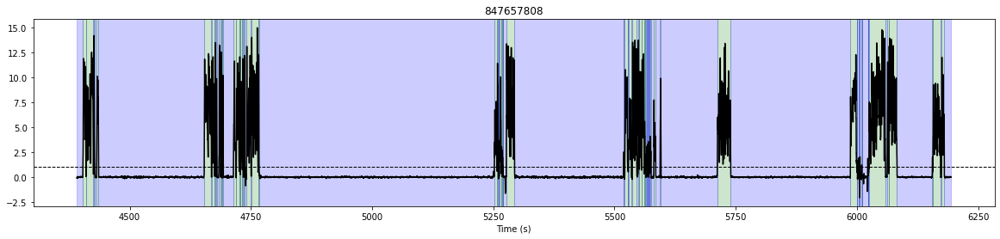

In [7]:
for session in SESSIONS:
    print(f"\nAnalyzing session: \t{session}")

    # load data
    data_in = pd.read_pickle(f"{PROJECT_PATH}/data/behavior/running/spontaneous/running_{session}.pkl")
    behavior_series = data_in.analogsignals[4]
    above_epochs, below_epochs = find_segments(behavior_series.magnitude.T[0], 
                                                 THRESHOLD, True)
    
    above_epochs = above_epochs.astype('float64')/RF
    below_epochs = below_epochs.astype('float64')/RF
    
    above_epochs += float(behavior_series.t_start)
    below_epochs += float(behavior_series.t_start)
    
    print(f"\nAbove Epochs: {len(above_epochs)}\tBelow Epochs: {len(below_epochs)}\n")
    
    plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, above_epochs, below_epochs, threshold=THRESHOLD, mark_epochs=False)
    plt.title(session)
    # plt.title(f"{session} - Above")
    
    # plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, below_epochs, 1)
    # plt.title(f"{session} - Below")

Join Epochs with Gap:


Analyzing session: 	766640955
Identified 44 epochs
Joined 28 / 44 epochs
Joined 32 / 45 epochs

Above Epochs: 16	Below Epochs: 13


Analyzing session: 	767871931
Identified 22 epochs
Joined 13 / 22 epochs
Joined 6 / 22 epochs

Above Epochs: 9	Below Epochs: 16


Analyzing session: 	768515987
Identified 157 epochs
Joined 87 / 157 epochs
Joined 136 / 157 epochs

Above Epochs: 70	Below Epochs: 21


Analyzing session: 	771160300
Identified 75 epochs
Joined 56 / 75 epochs
Joined 42 / 76 epochs

Above Epochs: 19	Below Epochs: 34


Analyzing session: 	771990200
Identified 47 epochs
Joined 27 / 47 epochs
Joined 25 / 48 epochs

Above Epochs: 20	Below Epochs: 23


Analyzing session: 	774875821
Identified 50 epochs
Joined 19 / 50 epochs
Joined 26 / 51 epochs

Above Epochs: 31	Below Epochs: 25


Analyzing session: 	778240327
Identified 114 epochs
Joined 77 / 114 epochs
Joined 28 / 113 epochs

Above Epochs: 37	Below Epochs: 85


Analyzing session: 	778998620
Identified 14 epochs
Joined 6 / 14 epoch

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Analyzing session: 	840012044
Identified 80 epochs
Joined 22 / 80 epochs
Joined 18 / 81 epochs

Above Epochs: 58	Below Epochs: 63


Analyzing session: 	847657808
Identified 60 epochs
Joined 42 / 60 epochs
Joined 34 / 61 epochs

Above Epochs: 18	Below Epochs: 27



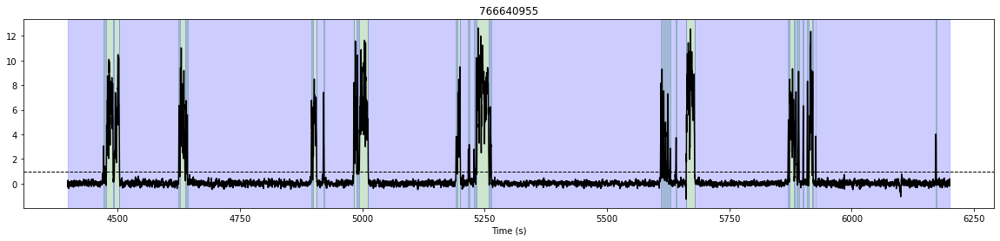

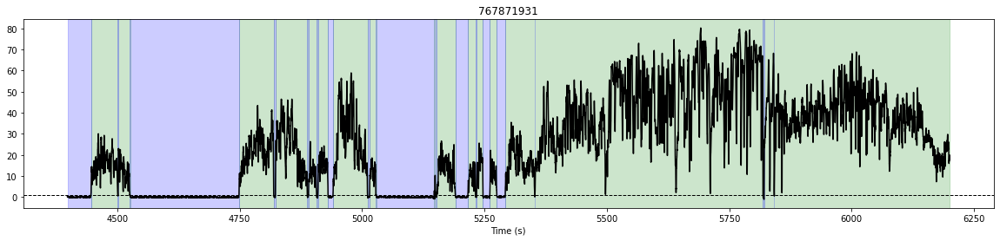

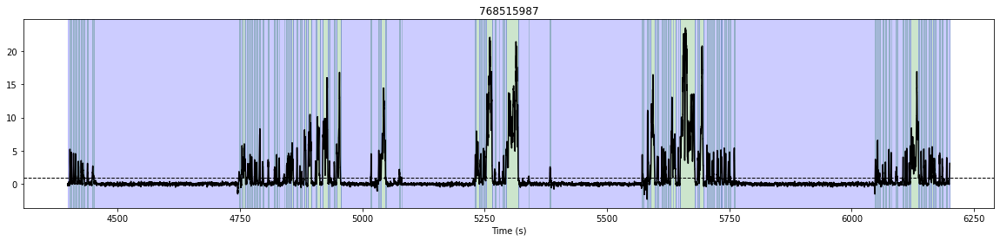

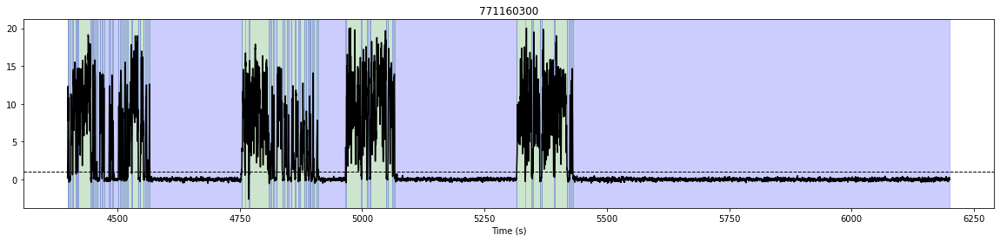

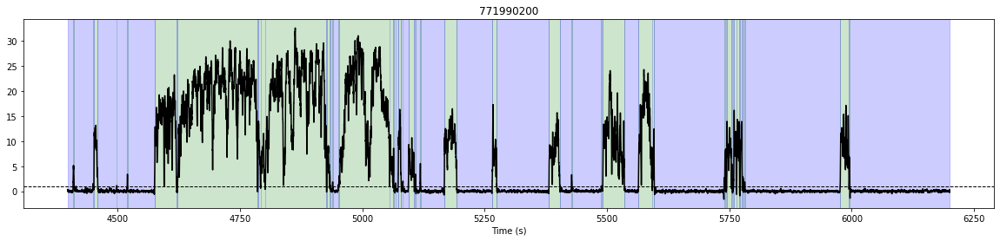

...

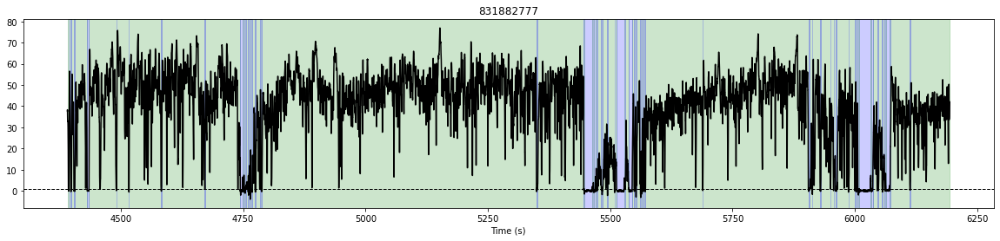

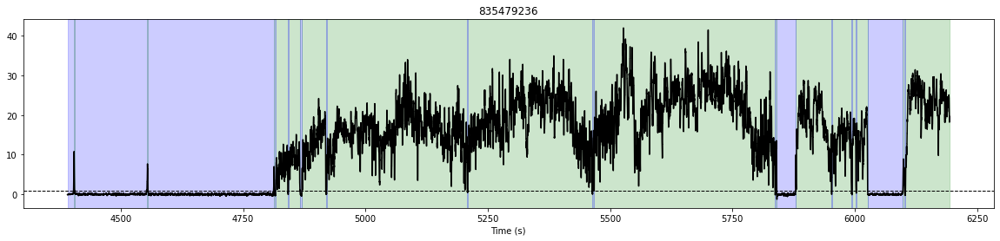

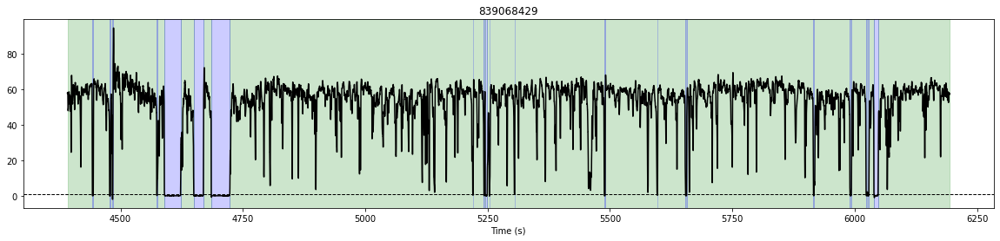

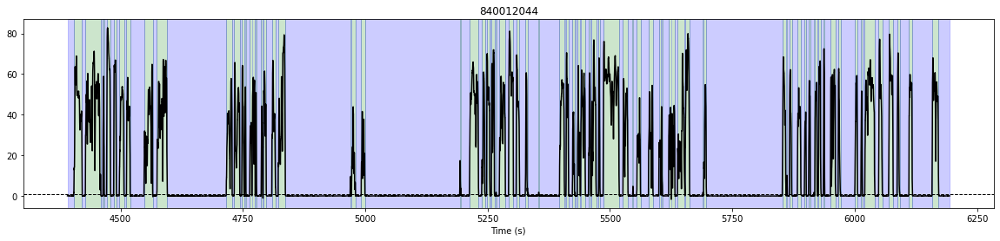

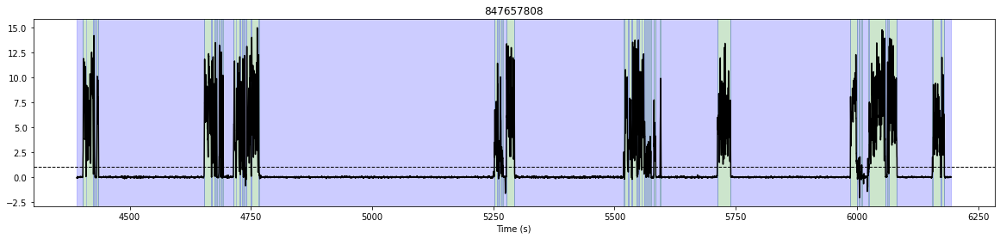

In [14]:
for session in SESSIONS:
    print(f"\nAnalyzing session: \t{session}")

    # load data
    data_in = pd.read_pickle(f"{PROJECT_PATH}/data/behavior/running/spontaneous/running_{session}.pkl")
    behavior_series = data_in.analogsignals[4]
    above_epochs, below_epochs = find_segments(behavior_series.magnitude.T[0], 
                                                 THRESHOLD, True)
    
    above_epochs = join_epochs_with_gap(above_epochs/RF, min_gap=MIN_GAP)
    below_epochs = join_epochs_with_gap(below_epochs/RF, min_gap=MIN_GAP)
    
    above_epochs += float(behavior_series.t_start)
    below_epochs += float(behavior_series.t_start)
    
    print(f"\nAbove Epochs: {len(above_epochs)}\tBelow Epochs: {len(below_epochs)}\n")
    
    plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, above_epochs, below_epochs, threshold=THRESHOLD, mark_epochs=False)
    plt.title(session)
    # plt.title(f"{session} - Above")
    
    # plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, below_epochs, 1)
    # plt.title(f"{session} - Below")

Drop Short Epochs


Analyzing session: 	766640955
Identified 44 epochs
Joined 28 / 44 epochs
Joined 32 / 45 epochs
Dropped 13 / 16 epochs
Dropped 4 / 13 epochs

Above Epochs: 3	Below Epochs: 9


Analyzing session: 	767871931
Identified 22 epochs
Joined 13 / 22 epochs
Joined 6 / 22 epochs
Dropped 2 / 9 epochs
Dropped 13 / 16 epochs

Above Epochs: 7	Below Epochs: 3


Analyzing session: 	768515987
Identified 157 epochs
Joined 87 / 157 epochs
Joined 136 / 157 epochs
Dropped 69 / 70 epochs
Dropped 12 / 21 epochs

Above Epochs: 1	Below Epochs: 9


Analyzing session: 	771160300
Identified 75 epochs
Joined 56 / 75 epochs
Joined 42 / 76 epochs
Dropped 13 / 19 epochs
Dropped 30 / 34 epochs

Above Epochs: 6	Below Epochs: 4


Analyzing session: 	771990200
Identified 47 epochs
Joined 27 / 47 epochs
Joined 25 / 48 epochs
Dropped 15 / 20 epochs
Dropped 14 / 23 epochs

Above Epochs: 5	Below Epochs: 9


Analyzing session: 	774875821
Identified 50 epochs
Joined 19 / 50 epochs
Joined 26 / 51 epochs
Dropped 31 / 31 epochs
D

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


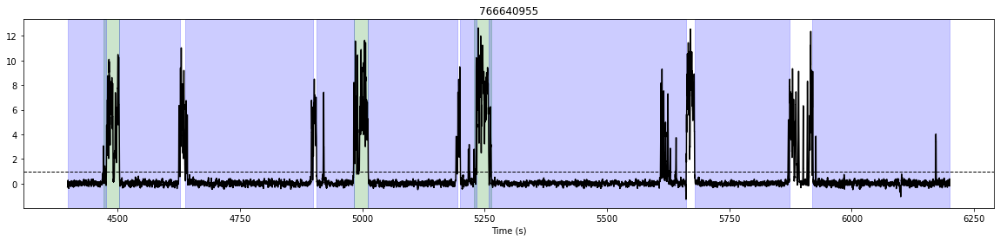

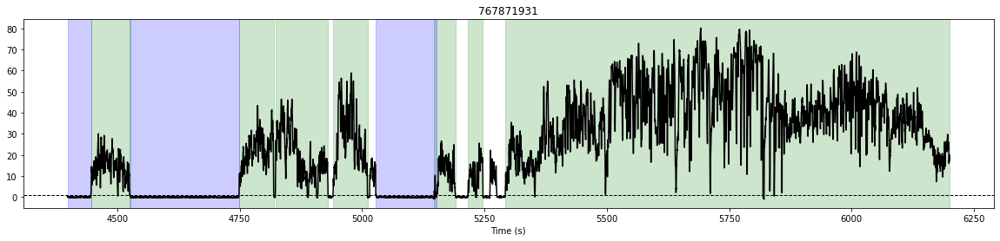

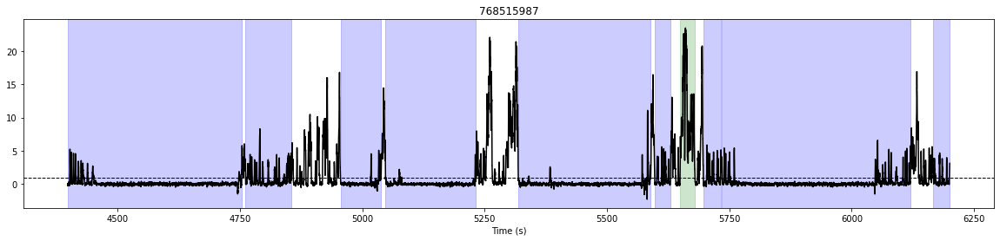

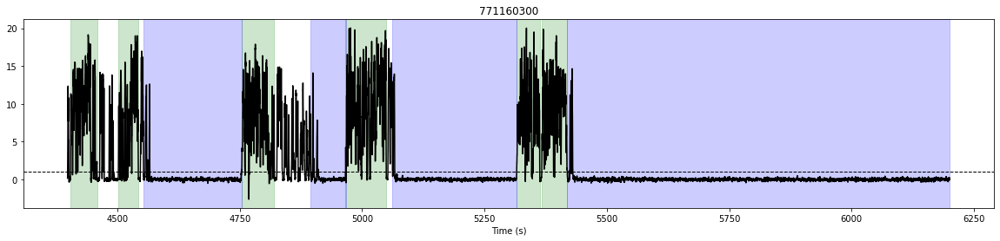

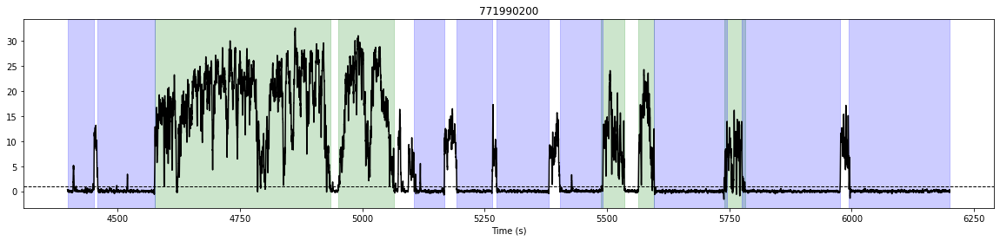

...

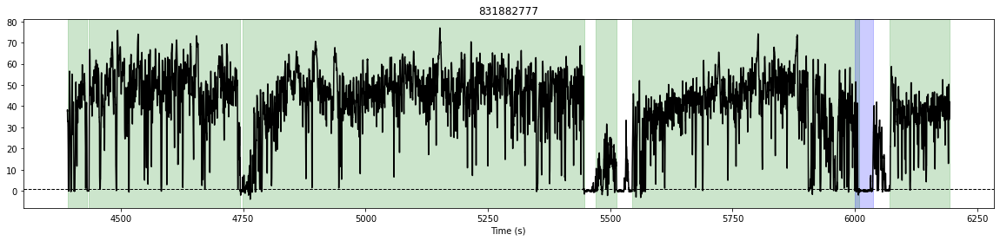

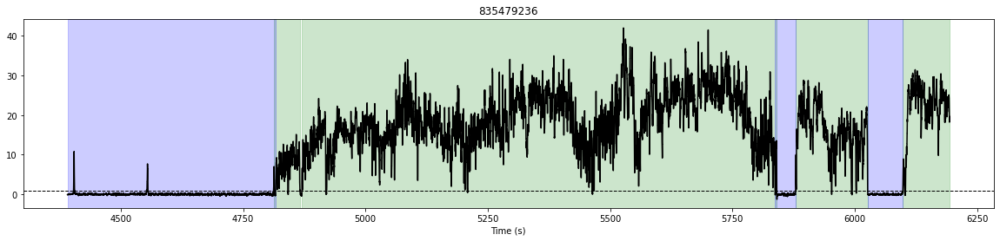

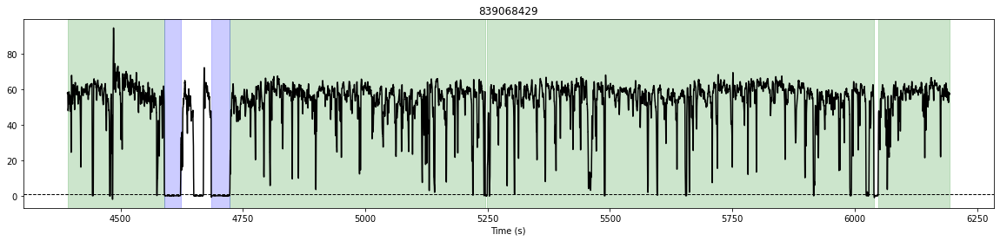

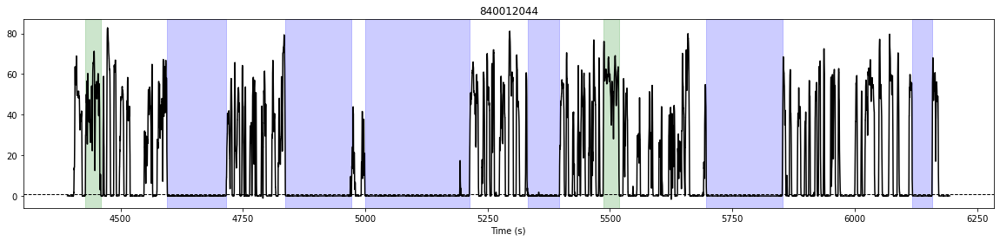

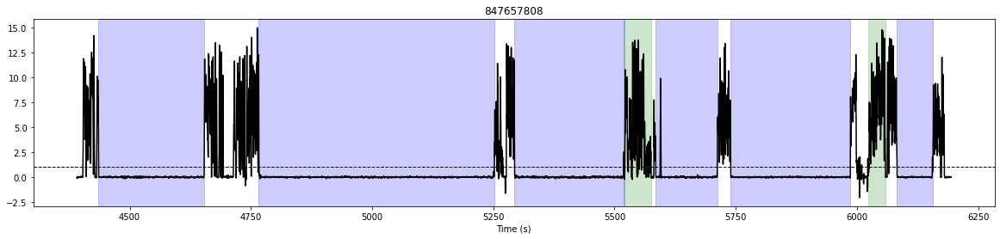

In [15]:
for session in SESSIONS:
    print(f"\nAnalyzing session: \t{session}")

    # load data
    data_in = pd.read_pickle(f"{PROJECT_PATH}/data/behavior/running/spontaneous/running_{session}.pkl")
    behavior_series = data_in.analogsignals[4]
    above_epochs, below_epochs = find_segments(behavior_series.magnitude.T[0], 
                                                 THRESHOLD, True)
    
    above_epochs = join_epochs_with_gap(above_epochs/RF, min_gap=MIN_GAP)
    below_epochs = join_epochs_with_gap(below_epochs/RF, min_gap=MIN_GAP)
    
    # drop short epochs
    above_epochs = drop_short_epochs(above_epochs, min_duration=MIN_DURATION)
    below_epochs = drop_short_epochs(below_epochs, min_duration=MIN_DURATION)
    
    above_epochs += float(behavior_series.t_start)
    below_epochs += float(behavior_series.t_start)
    
    print(f"\nAbove Epochs: {len(above_epochs)}\tBelow Epochs: {len(below_epochs)}\n")
    
    plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, above_epochs, below_epochs, threshold=THRESHOLD, mark_epochs=False)
    plt.title(session)
    # plt.title(f"{session} - Above")
    
    # plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, below_epochs, 1)
    # plt.title(f"{session} - Below")

Put It All Together with get_epoch_times:


Analyzing session: 	766640955
Identified 44 epochs
Joined 28 / 44 epochs
Joined 32 / 45 epochs
Dropped 13 / 16 epochs
Dropped 4 / 13 epochs

Above Epochs: 3	Below Epochs: 51


Analyzing session: 	767871931
Identified 22 epochs
Joined 13 / 22 epochs
Joined 6 / 22 epochs
Dropped 2 / 9 epochs
Dropped 13 / 16 epochs

Above Epochs: 41	Below Epochs: 12


Analyzing session: 	768515987
Identified 157 epochs
Joined 87 / 157 epochs
Joined 136 / 157 epochs
Dropped 69 / 70 epochs
Dropped 12 / 21 epochs

Above Epochs: 1	Below Epochs: 46


Analyzing session: 	771160300
Identified 75 epochs
Joined 56 / 75 epochs
Joined 42 / 76 epochs
Dropped 13 / 19 epochs
Dropped 30 / 34 epochs

Above Epochs: 8	Below Epochs: 42


Analyzing session: 	771990200
Identified 47 epochs
Joined 27 / 47 epochs
Joined 25 / 48 epochs
Dropped 15 / 20 epochs
Dropped 14 / 23 epochs

Above Epochs: 17	Below Epochs: 29


Analyzing session: 	774875821
Identified 50 epochs
Joined 19 / 50 epochs
Joined 26 / 51 epochs
Dropped 31 / 31 e

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Identified 60 epochs
Joined 42 / 60 epochs
Joined 34 / 61 epochs
Dropped 16 / 18 epochs
Dropped 21 / 27 epochs

Above Epochs: 2	Below Epochs: 44



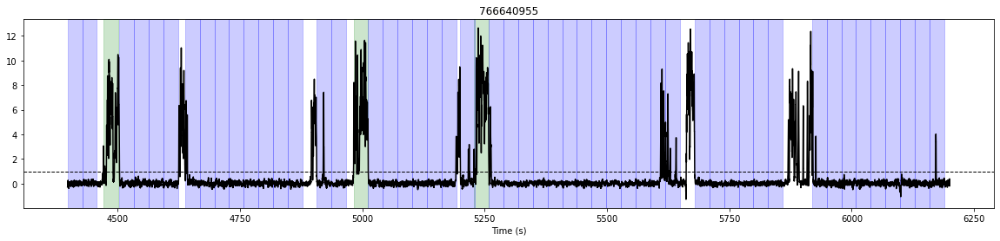

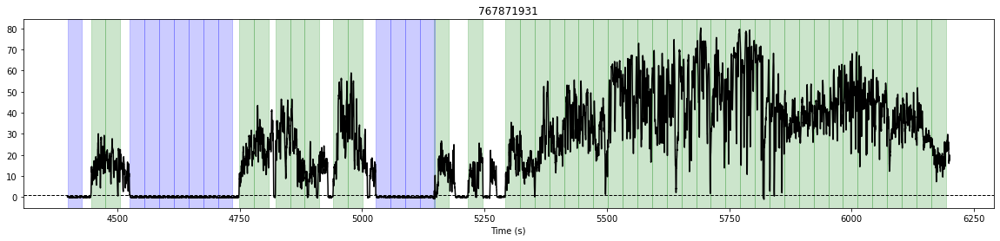

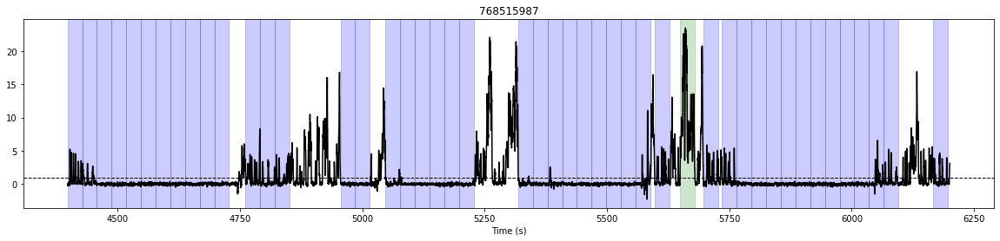

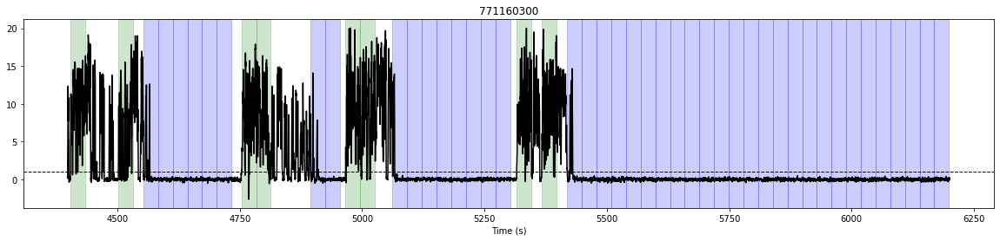

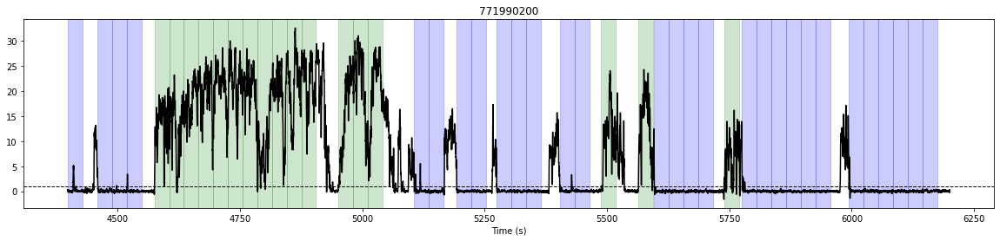

...

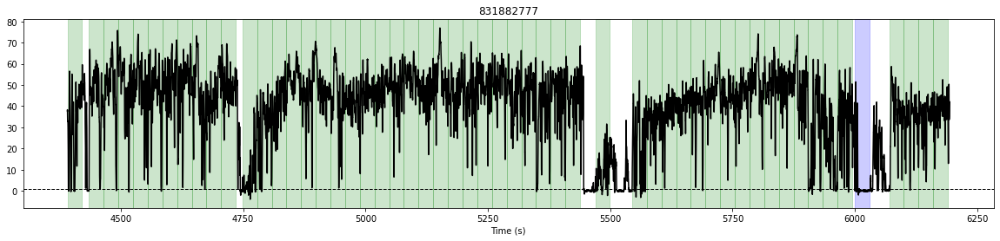

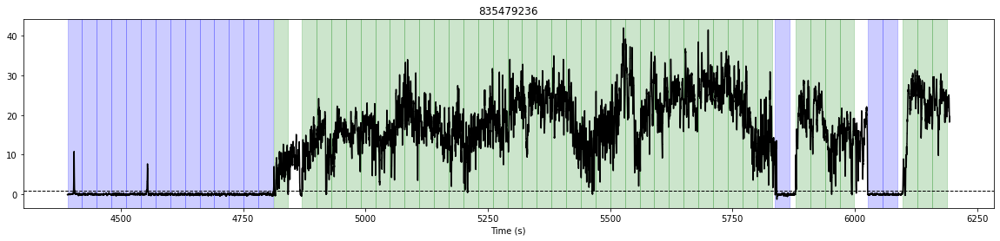

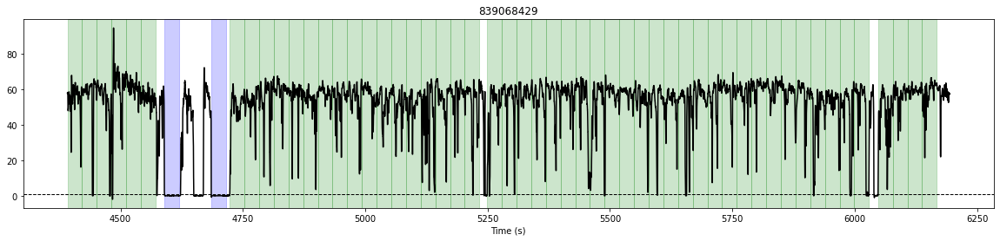

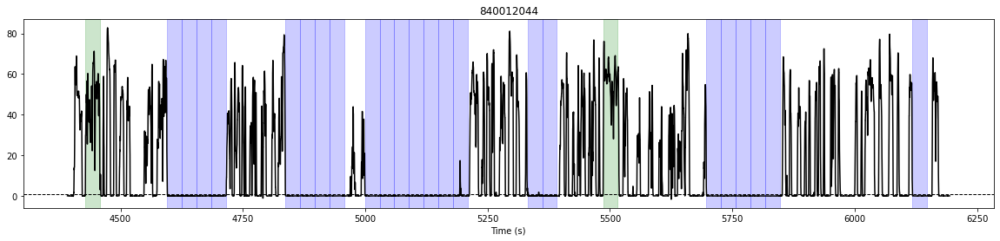

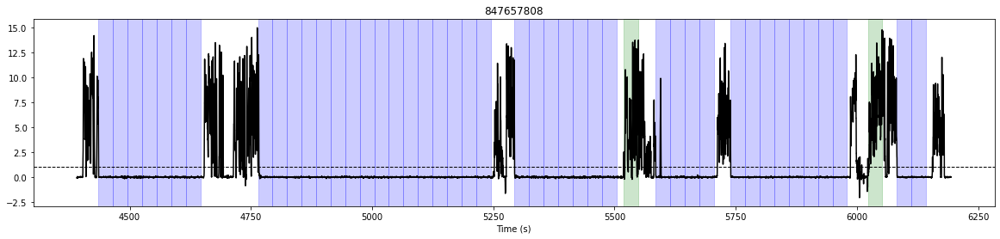

In [16]:
for session in SESSIONS:
    print(f"\nAnalyzing session: \t{session}")

    # load data
    data_in = pd.read_pickle(f"{PROJECT_PATH}/data/behavior/running/spontaneous/running_{session}.pkl")
    behavior_series = data_in.analogsignals[4]
    above_epochs, below_epochs = get_epoch_times(behavior_series.magnitude.T[0], 
                                                 THRESHOLD, MIN_GAP, MIN_DURATION, RF)
    
    above_epochs += float(behavior_series.t_start)
    below_epochs += float(behavior_series.t_start)
    above_epochs = np.array(split_epochs(above_epochs, MIN_DURATION))
    below_epochs = np.array(split_epochs(below_epochs, MIN_DURATION))
    
    print(f"\nAbove Epochs: {len(above_epochs)}\tBelow Epochs: {len(below_epochs)}\n")
    
    plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, above_epochs, below_epochs, threshold=THRESHOLD, mark_epochs=False)
    plt.title(session)
    # plt.title(f"{session} - Above")
    
    # plot_epochs(behavior_series.magnitude.T[0], behavior_series.times, below_epochs, 1)
    # plt.title(f"{session} - Below")

In [12]:
# 6 or 7 problematic sessions with few epochs

# raising min_gap helps a tiny bit

# Pupil Data

In [11]:
PF = 50

In [12]:
# settings
THRESHOLD = 0
MIN_GAP = 0.5
MIN_DURATION = 5

Identified 2152 epochs
Joined 1533 / 2152 epochs
Joined 1848 / 2153 epochs
Dropped 615 / 619 epochs
Dropped 183 / 305 epochs
Found 4 Above Epochs and 122 Below Epochs

Identified 4225 epochs
Joined 3490 / 4225 epochs
Joined 4059 / 4225 epochs
Dropped 723 / 735 epochs
Dropped 59 / 166 epochs
Found 12 Above Epochs and 107 Below Epochs

Identified 1945 epochs
Joined 1369 / 1945 epochs
Joined 1649 / 1946 epochs
Dropped 575 / 576 epochs
Dropped 176 / 297 epochs
Found 1 Above Epochs and 121 Below Epochs

Identified 2533 epochs
Joined 1914 / 2533 epochs
Joined 2289 / 2534 epochs
Dropped 614 / 619 epochs
Dropped 127 / 245 epochs
Found 5 Above Epochs and 118 Below Epochs

Identified 2714 epochs
Joined 2028 / 2714 epochs
Joined 2474 / 2715 epochs
Dropped 673 / 686 epochs
Dropped 122 / 241 epochs
Found 13 Above Epochs and 119 Below Epochs

Identified 4059 epochs
Joined 3364 / 4059 epochs
Joined 3894 / 4060 epochs
Dropped 686 / 695 epochs
Dropped 61 / 166 epochs
Found 9 Above Epochs and 105 Below 

../..\allen_vc\plts.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=[20,4])


Identified 2981 epochs
Joined 2364 / 2981 epochs
Joined 2736 / 2982 epochs
Dropped 608 / 617 epochs
Dropped 118 / 246 epochs
Found 9 Above Epochs and 128 Below Epochs

Identified 2604 epochs
Joined 2020 / 2604 epochs
Joined 2420 / 2605 epochs
Dropped 571 / 584 epochs
Dropped 75 / 185 epochs
Found 13 Above Epochs and 110 Below Epochs

Identified 2563 epochs
Joined 1946 / 2563 epochs
Joined 2339 / 2564 epochs
Dropped 604 / 617 epochs
Dropped 104 / 225 epochs
Found 13 Above Epochs and 121 Below Epochs

Identified 3146 epochs
Joined 2525 / 3146 epochs
Joined 2943 / 3147 epochs
Dropped 605 / 621 epochs
Dropped 93 / 204 epochs
Found 16 Above Epochs and 111 Below Epochs

Identified 3483 epochs
Joined 2903 / 3483 epochs
Joined 3370 / 3484 epochs
Dropped 557 / 580 epochs
Dropped 44 / 114 epochs
Found 23 Above Epochs and 70 Below Epochs

Identified 4929 epochs
Joined 4166 / 4929 epochs
Joined 4834 / 4930 epochs
Dropped 755 / 763 epochs
Dropped 20 / 96 epochs
Found 8 Above Epochs and 76 Below Epo

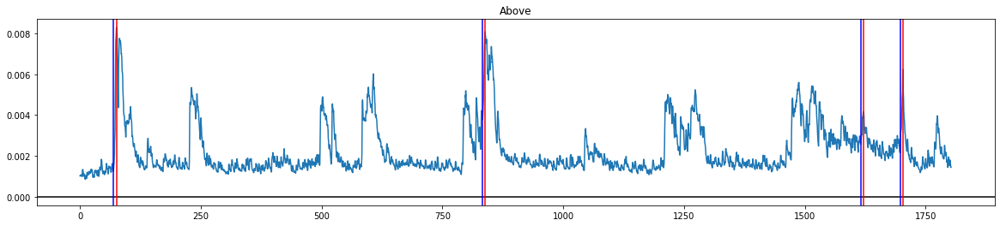

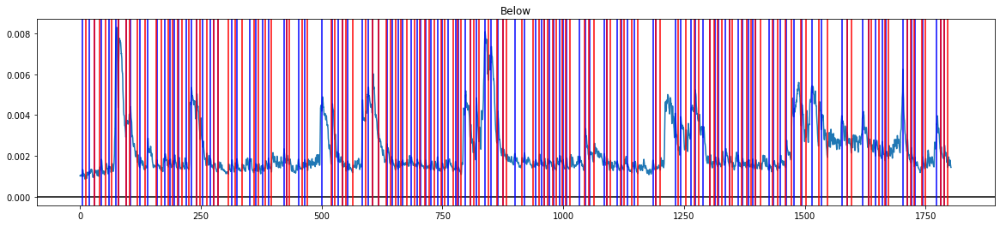

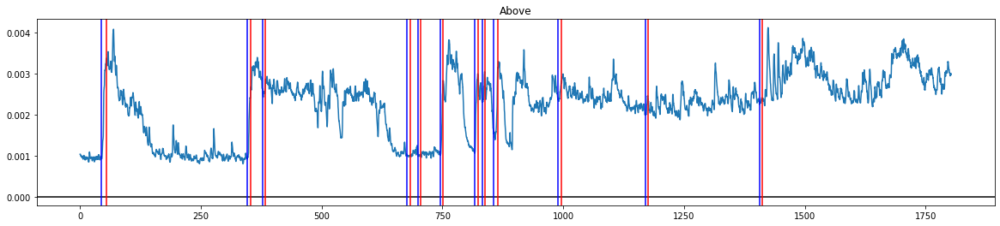

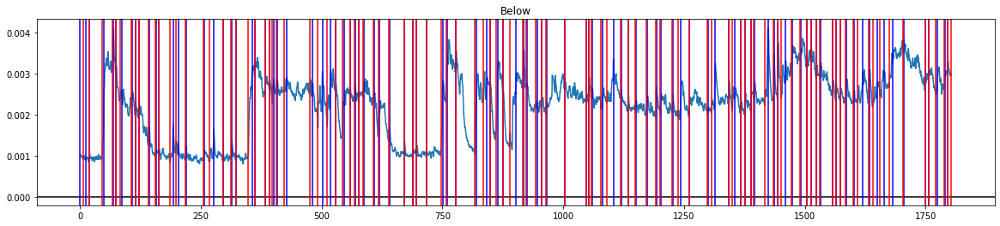

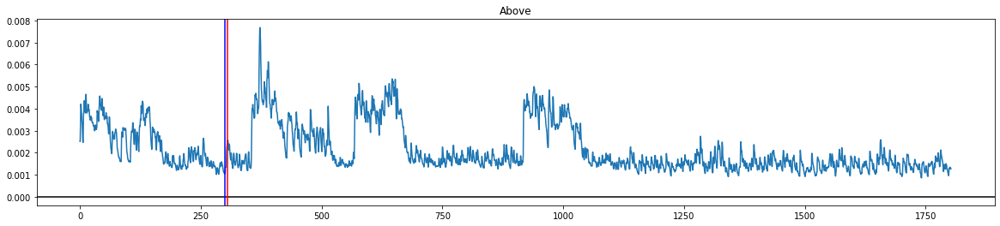

...

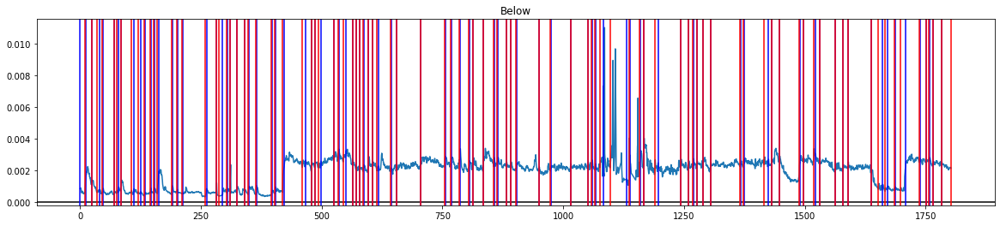

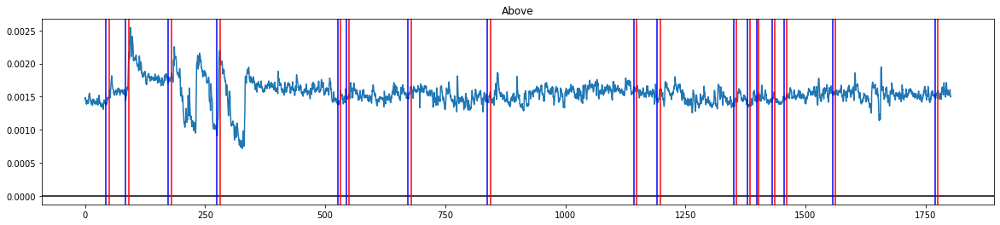

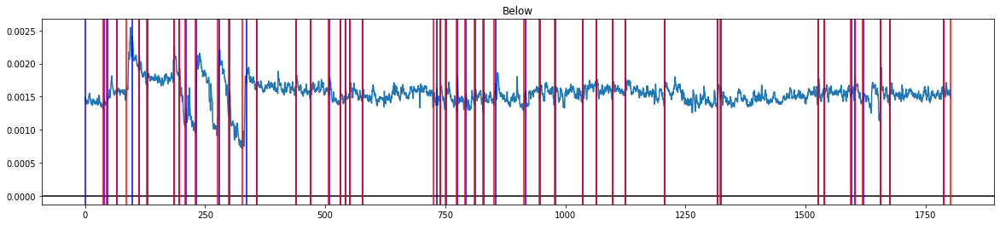

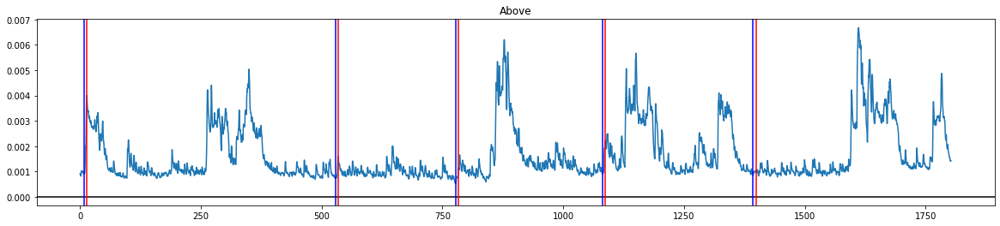

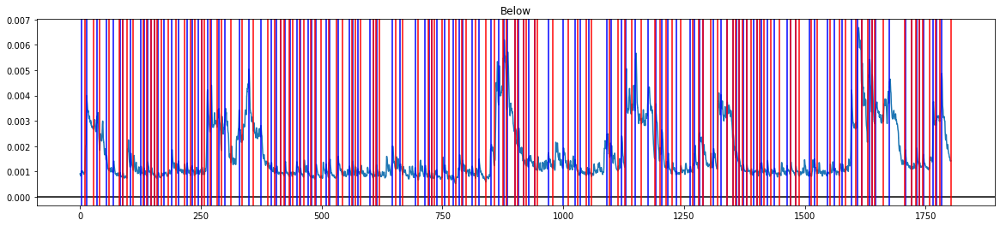

In [15]:
for session_id in SESSIONS:
    if not os.path.exists(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl"):
        continue
    group = pd.read_pickle(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl")
    sig =  group.analogsignals[4]
    area_deriv = np.diff(sig.magnitude.T[0])
    above, below = get_epoch_times(area_deriv, THRESHOLD, MIN_GAP, MIN_DURATION, PF)
    
    print(f'Found {len(above)} Above Epochs and {len(below)} Below Epochs\n')
    
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, above, THRESHOLD)
    plt.title("Above")
                
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, below, THRESHOLD)
    plt.title("Below")
    

In [16]:
# settings
THRESHOLD = 0
MIN_GAP = 0.1
MIN_DURATION = 1

Identified 2152 epochs
Joined 832 / 2152 epochs
Joined 1327 / 2153 epochs
Dropped 1199 / 1320 epochs
Dropped 344 / 826 epochs
Found 121 Above Epochs and 482 Below Epochs

Identified 4225 epochs
Joined 1761 / 4225 epochs
Joined 3147 / 4225 epochs
Dropped 2365 / 2464 epochs
Dropped 587 / 1078 epochs
Found 99 Above Epochs and 491 Below Epochs

Identified 1945 epochs
Joined 753 / 1945 epochs
Joined 1163 / 1946 epochs
Dropped 1055 / 1192 epochs
Dropped 336 / 783 epochs
Found 137 Above Epochs and 447 Below Epochs

Identified 2533 epochs
Joined 1010 / 2533 epochs
Joined 1688 / 2534 epochs
Dropped 1408 / 1523 epochs
Dropped 381 / 846 epochs
Found 115 Above Epochs and 465 Below Epochs

Identified 2714 epochs
Joined 1096 / 2714 epochs
Joined 1763 / 2715 epochs
Dropped 1504 / 1618 epochs
Dropped 486 / 952 epochs
Found 114 Above Epochs and 466 Below Epochs

Identified 4059 epochs
Joined 1785 / 4059 epochs
Joined 2999 / 4060 epochs
Dropped 2176 / 2274 epochs
Dropped 559 / 1061 epochs
Found 98 Above

../..\allen_vc\plts.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=[20,4])


Identified 3018 epochs
Joined 1251 / 3018 epochs
Joined 2140 / 3019 epochs
Dropped 1662 / 1767 epochs
Dropped 452 / 879 epochs
Found 105 Above Epochs and 427 Below Epochs

Identified 2981 epochs
Joined 1292 / 2981 epochs
Joined 1931 / 2982 epochs
Dropped 1539 / 1689 epochs
Dropped 609 / 1051 epochs
Found 150 Above Epochs and 442 Below Epochs

Identified 2604 epochs
Joined 1028 / 2604 epochs
Joined 1812 / 2605 epochs
Dropped 1453 / 1576 epochs
Dropped 416 / 793 epochs
Found 123 Above Epochs and 377 Below Epochs

Identified 2563 epochs
Joined 1075 / 2563 epochs
Joined 1651 / 2564 epochs
Dropped 1356 / 1488 epochs
Dropped 452 / 913 epochs
Found 132 Above Epochs and 461 Below Epochs

Identified 3146 epochs
Joined 1320 / 3146 epochs
Joined 2193 / 3147 epochs
Dropped 1717 / 1826 epochs
Dropped 511 / 954 epochs
Found 109 Above Epochs and 443 Below Epochs

Identified 3483 epochs
Joined 1434 / 3483 epochs
Joined 2540 / 3484 epochs
Dropped 1977 / 2049 epochs
Dropped 519 / 944 epochs
Found 72 Abo

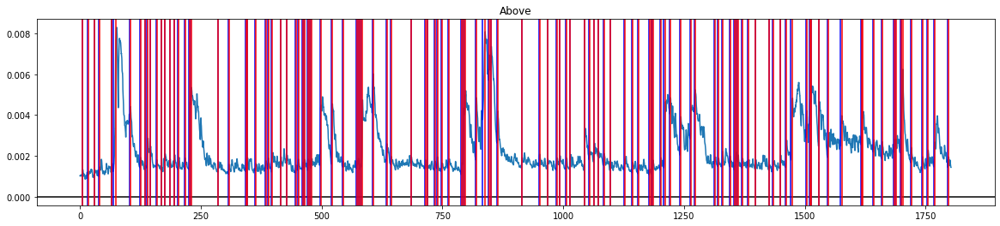

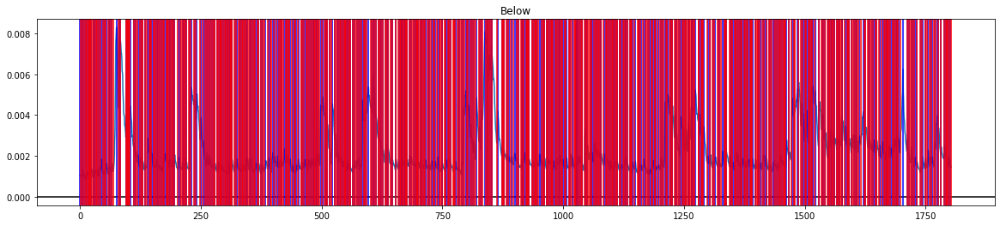

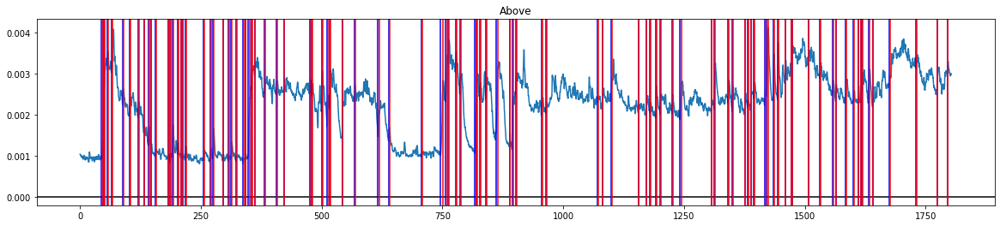

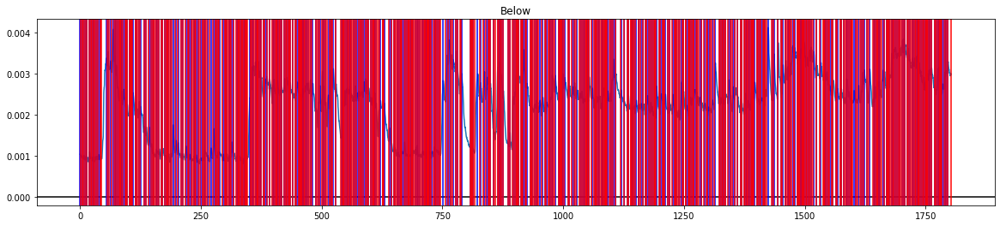

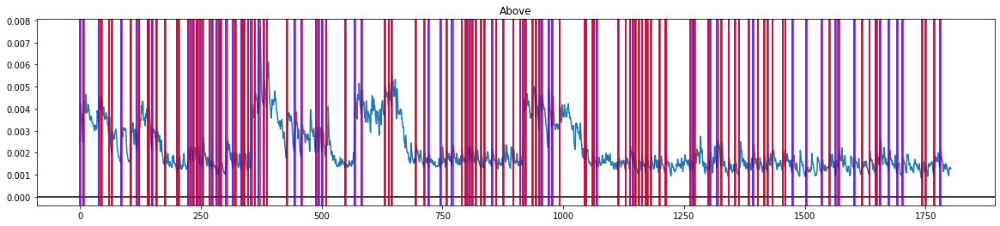

...

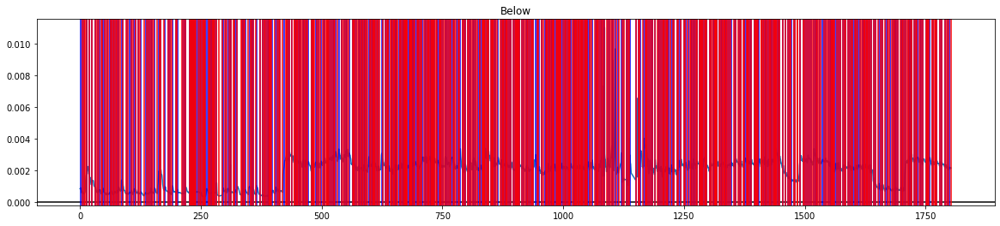

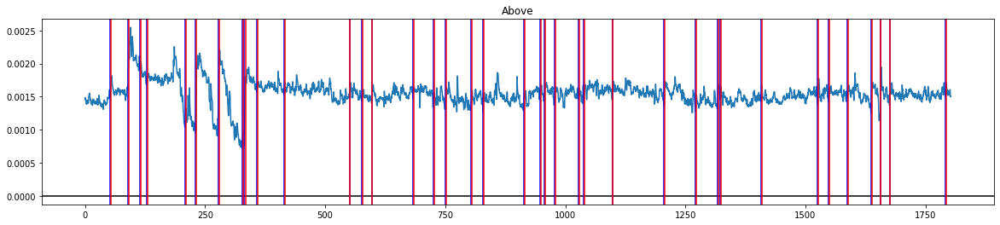

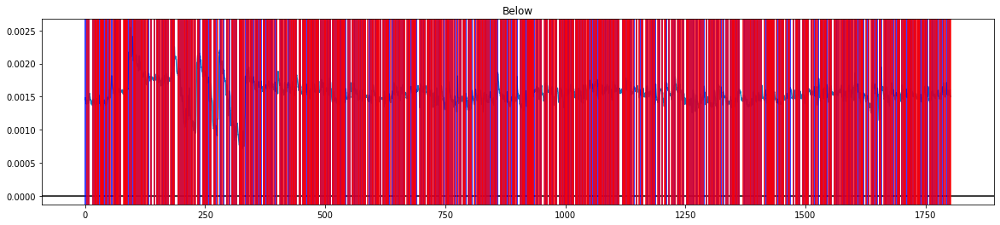

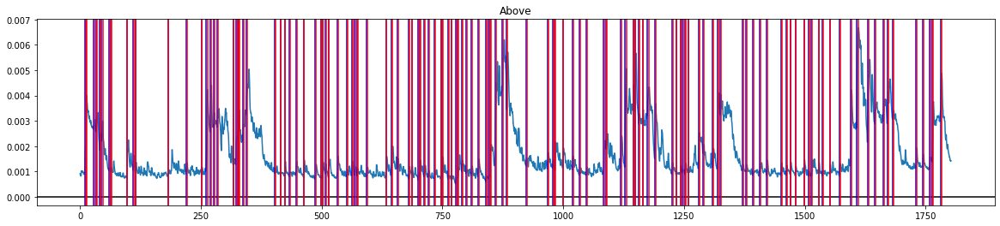

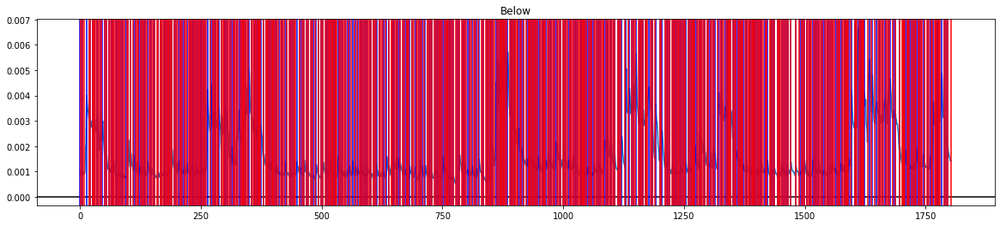

In [17]:
for session_id in SESSIONS:
    if not os.path.exists(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl"):
        continue
    group = pd.read_pickle(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl")
    sig =  group.analogsignals[4]
    area_deriv = np.diff(sig.magnitude.T[0])
    above, below = get_epoch_times(area_deriv, THRESHOLD, MIN_GAP, MIN_DURATION, PF)
    
    print(f'Found {len(above)} Above Epochs and {len(below)} Below Epochs\n')
    
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, above, THRESHOLD)
    plt.title("Above")
                
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, below, THRESHOLD)
    plt.title("Below")
    

In [20]:
# Next we'll try epoching the dilation and constriction epochs with different parameters due to the difference in their timescales

In [18]:
# settings
ABOVE_THRESHOLD = 0.0000025
BELOW_THRESHOLD = -0.0000001
MIN_GAP = 0.05
ABOVE_MIN_DURATION = 0.5
BELOW_MIN_DURATION = 2

Identified 4912 epochs
Joined 2205 / 4912 epochs
Joined 3837 / 4913 epochs
Dropped 2617 / 2707 epochs
Dropped 641 / 1076 epochs
Identified 3548 epochs
Joined 612 / 3548 epochs
Joined 2004 / 3548 epochs
Dropped 2863 / 2936 epochs
Dropped 1470 / 1544 epochs
Found 90 Above Epochs and 74 Below Epochs

Identified 5915 epochs
Joined 1879 / 5915 epochs
Joined 5232 / 5915 epochs
Dropped 4011 / 4036 epochs
Dropped 343 / 683 epochs
Identified 5717 epochs
Joined 1391 / 5717 epochs
Joined 2926 / 5716 epochs
Dropped 4237 / 4326 epochs
Dropped 2763 / 2790 epochs
Found 25 Above Epochs and 27 Below Epochs

Identified 4590 epochs
Joined 1953 / 4590 epochs
Joined 3609 / 4591 epochs
Dropped 2547 / 2637 epochs
Dropped 556 / 982 epochs
Identified 3443 epochs
Joined 553 / 3443 epochs
Joined 1973 / 3442 epochs
Dropped 2781 / 2890 epochs
Dropped 1361 / 1469 epochs
Found 90 Above Epochs and 108 Below Epochs

Identified 4849 epochs
Joined 1992 / 4849 epochs
Joined 3866 / 4850 epochs
Dropped 2758 / 2857 epochs
D

../..\allen_vc\plts.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=[20,4])


Identified 4792 epochs
Joined 1781 / 4792 epochs
Joined 4028 / 4793 epochs
Dropped 2932 / 3011 epochs
Dropped 458 / 765 epochs
Identified 4942 epochs
Joined 999 / 4942 epochs
Joined 2765 / 4941 epochs
Dropped 3856 / 3943 epochs
Dropped 2119 / 2176 epochs
Found 79 Above Epochs and 57 Below Epochs

Identified 5693 epochs
Joined 2164 / 5693 epochs
Joined 4867 / 5694 epochs
Dropped 3479 / 3529 epochs
Dropped 459 / 827 epochs
Identified 4647 epochs
Joined 994 / 4647 epochs
Joined 2581 / 4646 epochs
Dropped 3539 / 3653 epochs
Dropped 2014 / 2065 epochs
Found 50 Above Epochs and 51 Below Epochs

Identified 3988 epochs
Joined 1484 / 3988 epochs
Joined 3368 / 3989 epochs
Dropped 2454 / 2504 epochs
Dropped 415 / 621 epochs
Identified 4829 epochs
Joined 1038 / 4829 epochs
Joined 2831 / 4828 epochs
Dropped 3685 / 3791 epochs
Dropped 1922 / 1997 epochs
Found 50 Above Epochs and 75 Below Epochs

Identified 4177 epochs
Joined 1559 / 4177 epochs
Joined 3535 / 4178 epochs
Dropped 2580 / 2618 epochs
Dro

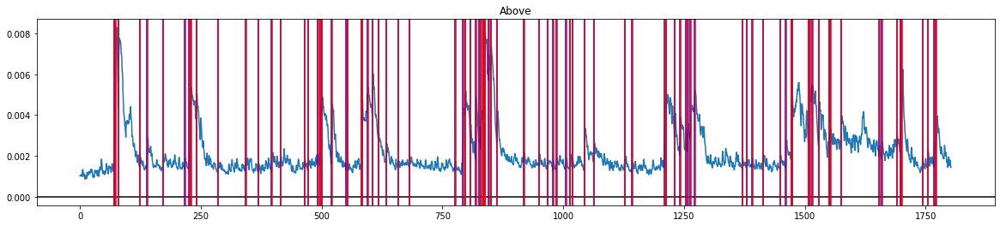

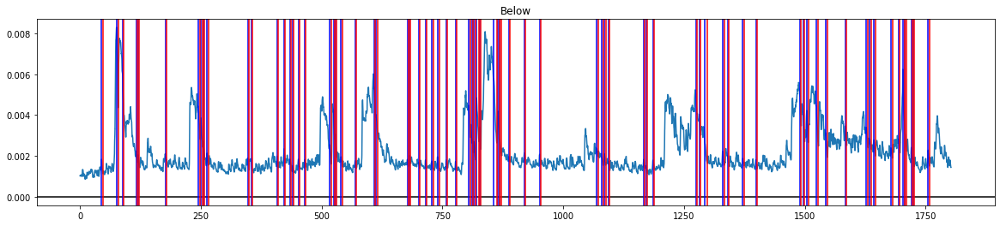

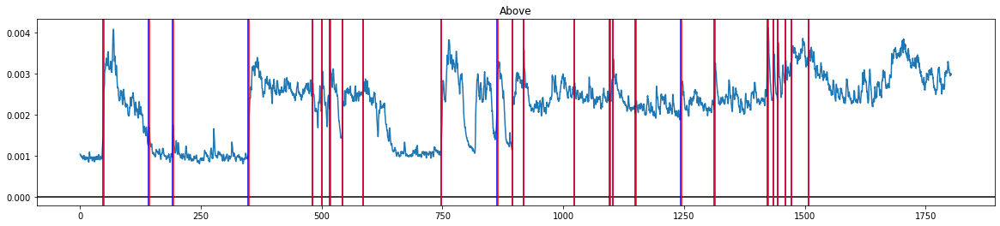

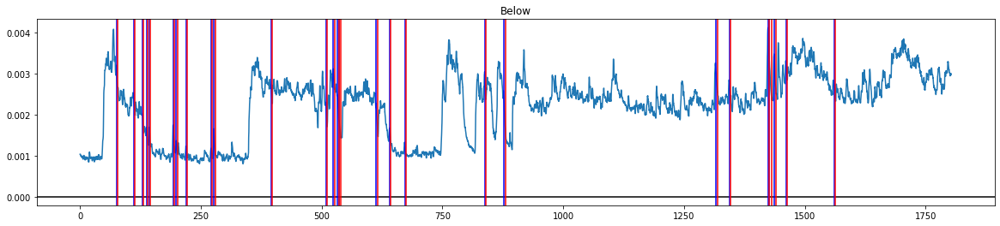

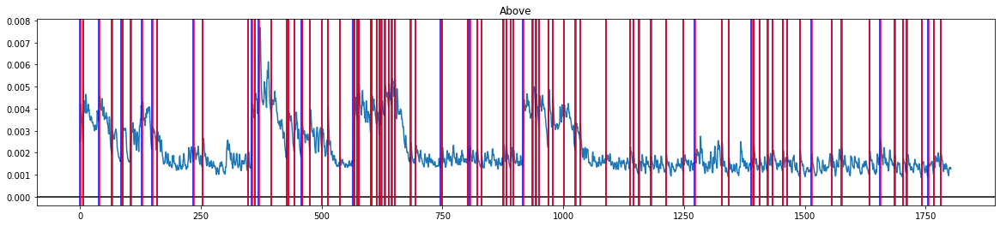

...

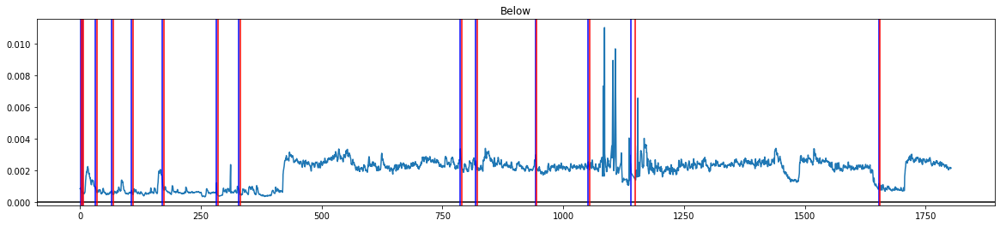

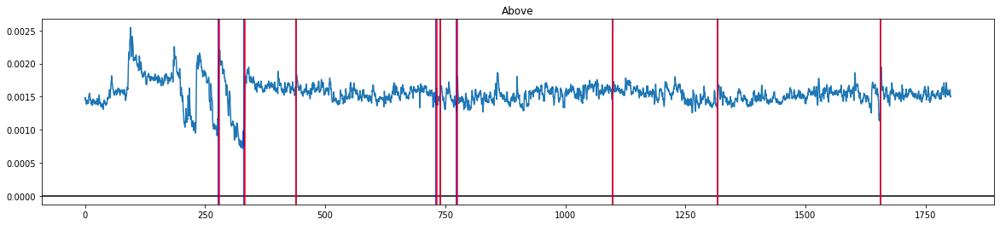

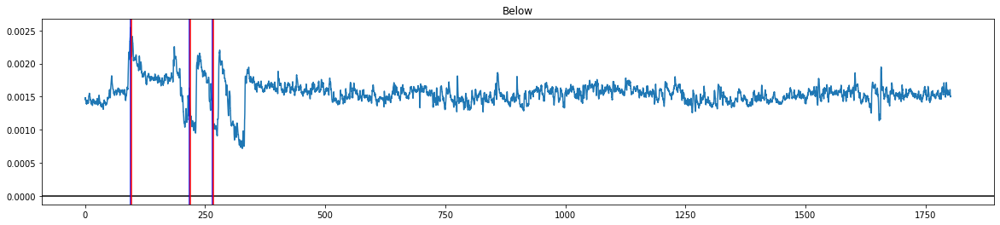

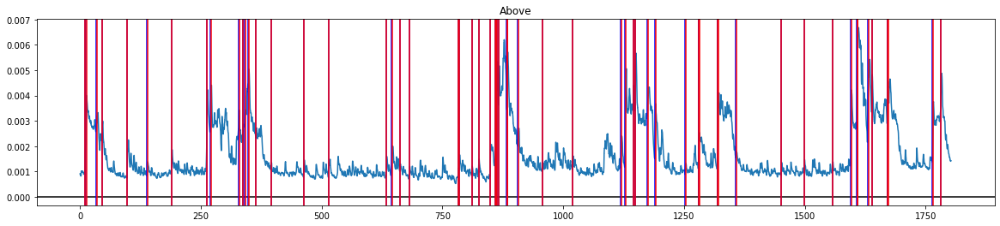

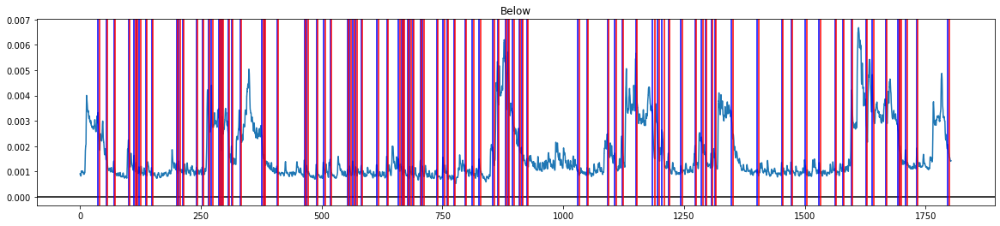

In [19]:
for session_id in SESSIONS:
    if not os.path.exists(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl"):
        continue
    group = pd.read_pickle(f"G:/Shared drives/visual_encoding/data/behavior/pupil/spontaneous/pupil_area_{session_id}.pkl")
    sig =  group.analogsignals[4]
    area_deriv = np.diff(sig.magnitude.T[0])
    above, _ = get_epoch_times(area_deriv, ABOVE_THRESHOLD, MIN_GAP, ABOVE_MIN_DURATION, PF)
    _, below = get_epoch_times(area_deriv, BELOW_THRESHOLD, MIN_GAP, BELOW_MIN_DURATION, PF)
    
    print(f'Found {len(above)} Above Epochs and {len(below)} Below Epochs\n')
    
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, above, THRESHOLD)
    plt.title("Above")
                
    plot_epochs(sig.magnitude.T[0], np.arange(0, len(sig.magnitude.T[0]))/PF, below, THRESHOLD)
    plt.title("Below")
    